In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
from PIL import Image as im
import cv2 

In [2]:
path = r'C:\Users\Ron\Desktop\Physics stuff\AY 2022-2023\AP157\github\Automated Feature Extraction\images'

# Background removal using thresholding

In [3]:
file1 = '\cheque.png' 
cheque = cv2.imread(path+file1,0) #load image in grayscale

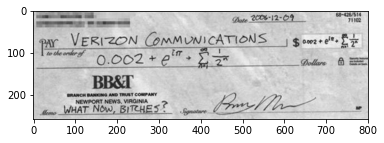

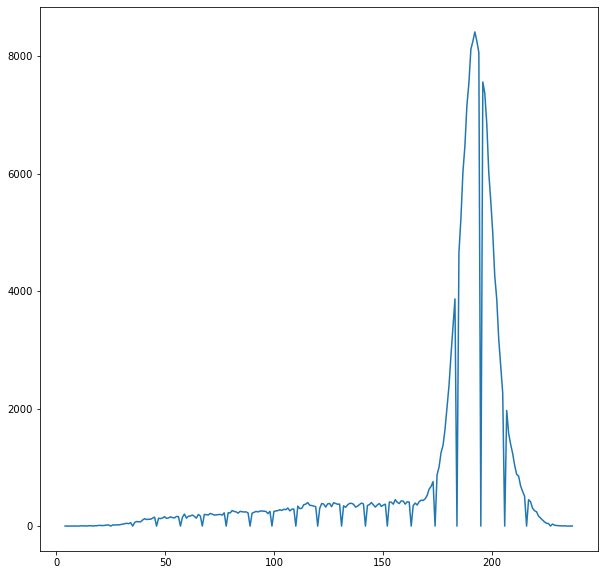

In [4]:
plt.imshow(cheque,cmap='gray') 
plt.figure(figsize=(10,10))
plt.plot(np.histogram(cheque, bins=256)[1][:-1], np.histogram(cheque, bins=256, density=False)[0]) #Displays grayscale histogram of image

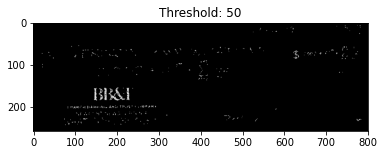

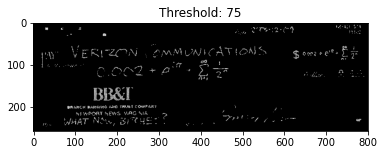

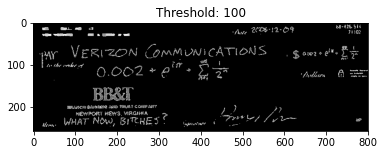

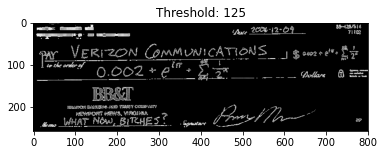

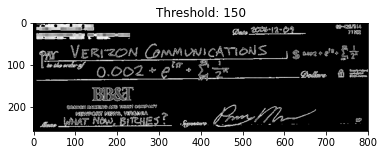

In [5]:
threshold=125 
thresholds = [50,75,100,125,150]
for t in thresholds: #set threshold grayscale intensity to remove background
    cheque_tresholded = (cheque<t)*cheque 
    plt.figure() 
    plt.imshow(cheque_tresholded,cmap='gray') 
    plt.title('Threshold: {}'.format(t))

# Normalized Chromaticity Coordinates    

In [6]:
#Convert to normalized chromaticity coordinates
def ncc(RGB):
    I = np.sum(RGB,axis=2) 
    I[I==0] = 1000000
    r,g= (RGB[:,:,0]/I), (RGB[:,:,1]/I) 
    b = 1-(r+g)
    result = np.stack([r,g,b],axis=2) 
    result[result==0] = 100000000
    return np.stack([r,g,b],axis=2) # Stack R, G, and B arrays along the third dimension


#Plots only the r and g channels in the NCC of the image.
def ncc_plotter(image, size=(10,10), color=True):
    image_ncc = ncc(image)
    r,g = image_ncc[:,:,0], image_ncc[:,:,1]
    b=1-(r+g)
    RGB_flat = image_ncc.reshape(-1,3)
    plt.figure(figsize=size)
    if color:
        plt.scatter(r,g, c=RGB_flat)
    else: 
        plt.scatter(r,g, c='k')
    plt.xlim([0,1])
    plt.ylim([0,1])

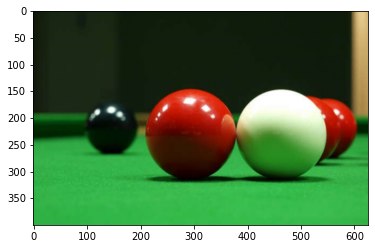

In [7]:
file2 = '\\billiard_ball.png'
billiard=mpimg.imread(path+file2)[:,:,:3]
plt.imshow(billiard)

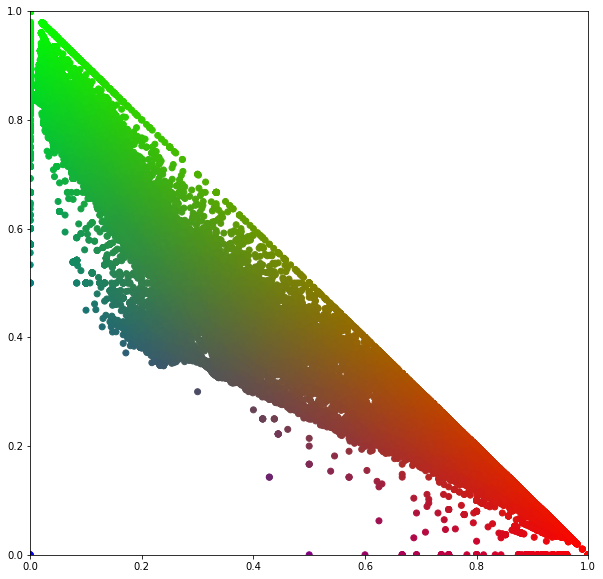

In [8]:
ncc_plotter(billiard, size=(10,10), color=True)

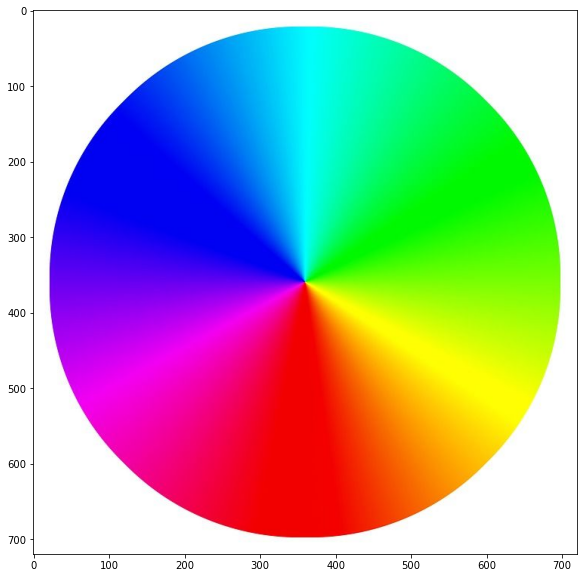

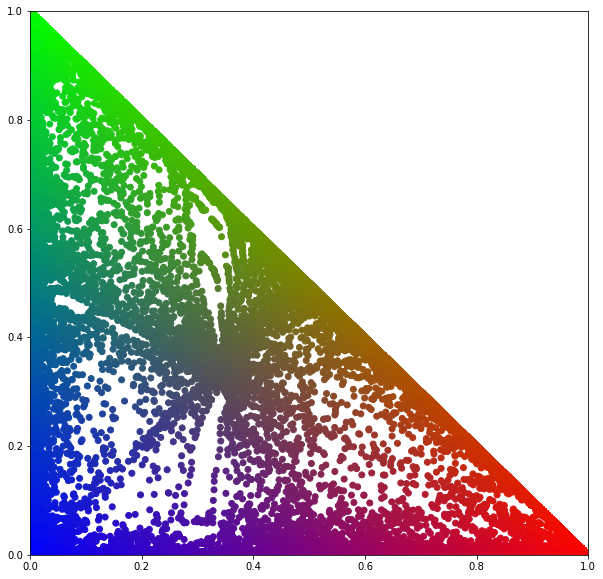

In [9]:
#Display color wheel NCC
image = cv2.imread(path+'\color_wheel.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
plt.figure(figsize=(10,10))
plt.imshow(image)
ncc_plotter(image, size=(10,10), color=True)

# Parametric Segmentation 

In [10]:
from skimage import filters  

def ROI(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
    r_coords = cv2.selectROI(image)
    roi = image[int(r_coords[1]):int(r_coords[1]+r_coords[3]),
                int(r_coords[0]):int(r_coords[0]+r_coords[2])]
    ROI = cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)
    return ROI 

def gaussian(mu,sigma, x): 
    mu,sigma,x= np.array(mu), np.array(sigma), np.array(x)
    if sigma == 0:
        a = np.zeros_like(x) 
        b=a
    else:
        a = (1/(sigma*np.sqrt(2*np.pi))) 
        b = np.exp(-(x-mu)**2/(2*sigma**2)) 
    return a*b 

def gaussian_segmenter(image, binarized=True):
    ROI_image = ROI(image)
    ROI_ncc = ncc(ROI_image)
    image_ncc = ncc(image)
    r_mean, g_mean = np.mean(ROI_ncc[:,:,0]), np.mean(ROI_ncc[:,:,1])
    r_std, g_std = np.std(ROI_ncc[:,:,0]), np.std(ROI_ncc[:,:,1])
    P = gaussian(r_mean, r_std,image_ncc[:,:,0])*gaussian(g_mean, g_std, image_ncc[:,:,1])
    if binarized: 
        threshold_value = filters.threshold_otsu(P[np.isfinite(P)])   #handle only finite values, remove NaNs 
        P = P > threshold_value
    return P 

def colored_gaussian_segmenter(image): 
    P = gaussian_segmenter(image,binarized=True)
    segmented_image = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    return segmented_image



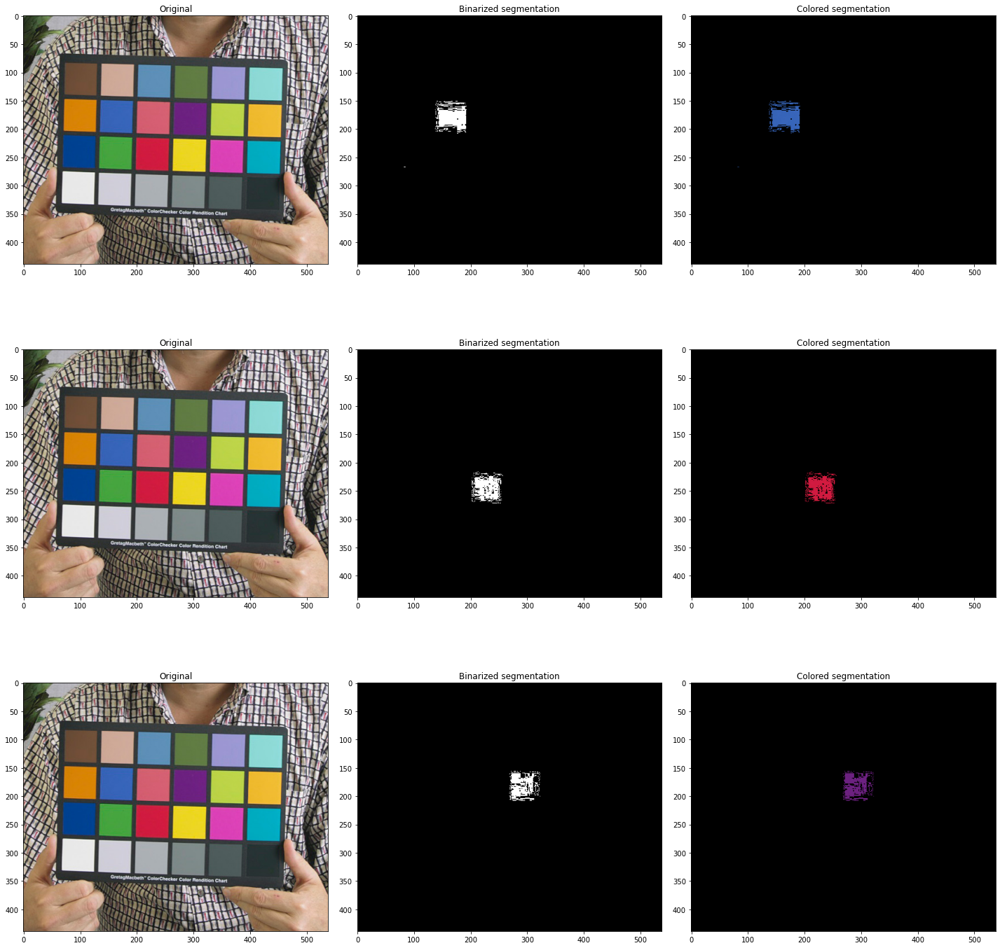

In [11]:
macbeth = cv2.imread(path+'\Gretag-Macbeth_ColorChecker.jpg')
macbeth = cv2.cvtColor(macbeth, cv2.COLOR_BGR2RGB) 
macbeth_ncc = ncc(macbeth) 

image = macbeth
runs = 3
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    P = gaussian_segmenter(image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    ax[3*i].imshow(image)
    ax[3*i].set_title('Original')
    ax[3*i + 1].imshow(P,cmap='gray') 
    ax[3*i+1].set_title('Binarized segmentation')
    ax[3*i + 2].imshow(segmented_colored) 
    ax[3*i+2].set_title('Colored segmentation')

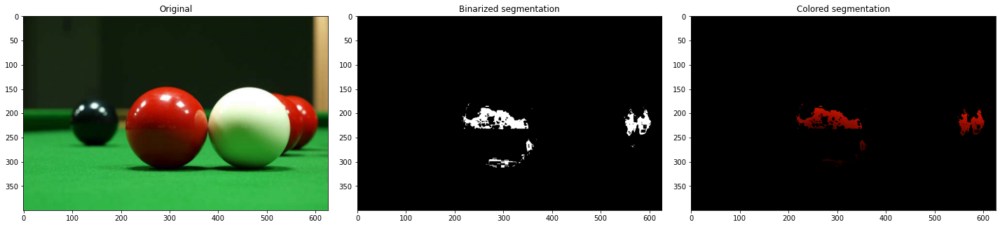

In [12]:
image = billiard
runs = 1
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    P = gaussian_segmenter(image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')
    ax[4*i + 1].imshow(P,cmap='gray') 
    ax[4*i+1].set_title('Binarized segmentation')
    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Colored segmentation')

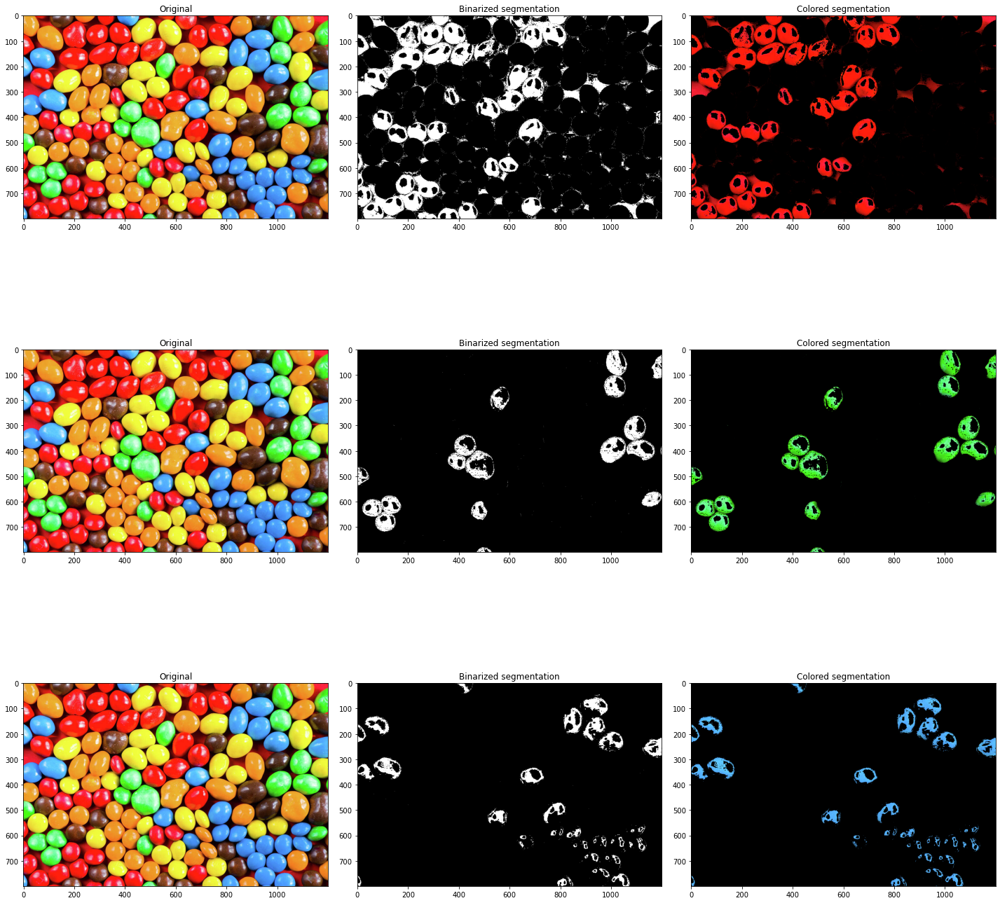

In [13]:
image = cv2.imread(path+'\m&ms.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

runs = 3
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    P = gaussian_segmenter(image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    ax[3*i].imshow(image)
    ax[3*i].set_title('Original')
    ax[3*i + 1].imshow(P,cmap='gray') 
    ax[3*i+1].set_title('Binarized segmentation')
    ax[3*i + 2].imshow(segmented_colored) 
    ax[3*i+2].set_title('Colored segmentation')

## Non-parametric Segmentation

Steps:
1. Create a 2D histogram of the ROI in NCC (r in y axis, g in x axis). 
2. Per pixel of the image, obtain the r and g in NCC space.
3. Obtain the histogram count of the corresponding (r,g)
4. Assign a grayscale value equal to that count.


In [14]:
def nonparametric_segmenter(image, bins=32, binarized=True):
    ROI_image = ROI(image)
    ROI_ncc, image_ncc = ncc(ROI_image), ncc(image) 

    #2D histogram of ROI
    x, y= ROI_ncc[:,:,0].flatten(), ROI_ncc[:,:,1].flatten()
    H = np.histogram2d(y,x, bins=bins, range=[[0,1],[0,1]])

    #Vectorized look-up algorithm based on 2D histogram
    x_indices = np.digitize(image_ncc[:,:,0], H[1]) - 1
    y_indices = np.digitize(image_ncc[:,:,1], H[2]) - 1

    # Prevent possible IndexErrors by clipping the values to the valid index ranges.
    x_indices = np.clip(x_indices, 0, bins-1)
    y_indices = np.clip(y_indices, 0, bins-1)
    
    P = H[0][y_indices, x_indices]
    if binarized: 
        threshold_value = filters.threshold_otsu(P[np.isfinite(P)])   #handle only finite values, remove NaNs 
        P = P > threshold_value
    return P


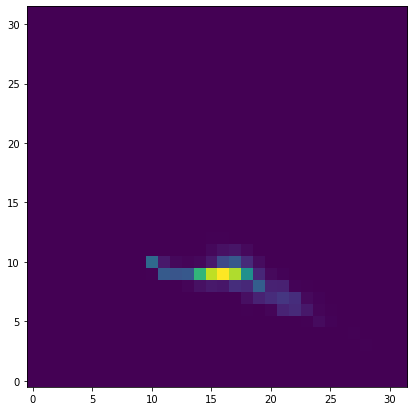

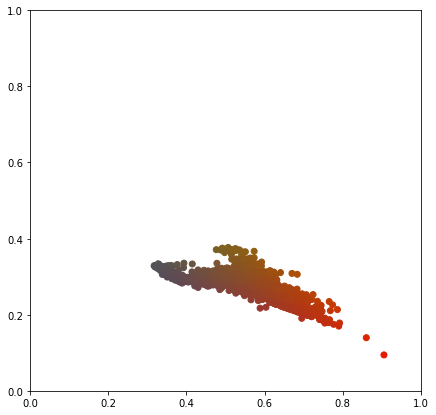

In [15]:
bins = 32 
image = cv2.imread(path+'\m&ms.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
ROI_image = ROI(image)
ROI_ncc, image_ncc = ncc(ROI_image), ncc(image) 

#2D histogram of ROI
x, y= ROI_ncc[:,:,0].flatten(), ROI_ncc[:,:,1].flatten()
H = np.histogram2d(y,x, bins=bins, range=[[0,1],[0,1]])

#Compare 2D histogram with NCC. They should look the same.
plt.figure(figsize=(7,7))
plt.imshow(H[0], origin='lower')
ncc_plotter(ROI_ncc,color=True,size=(7,7))

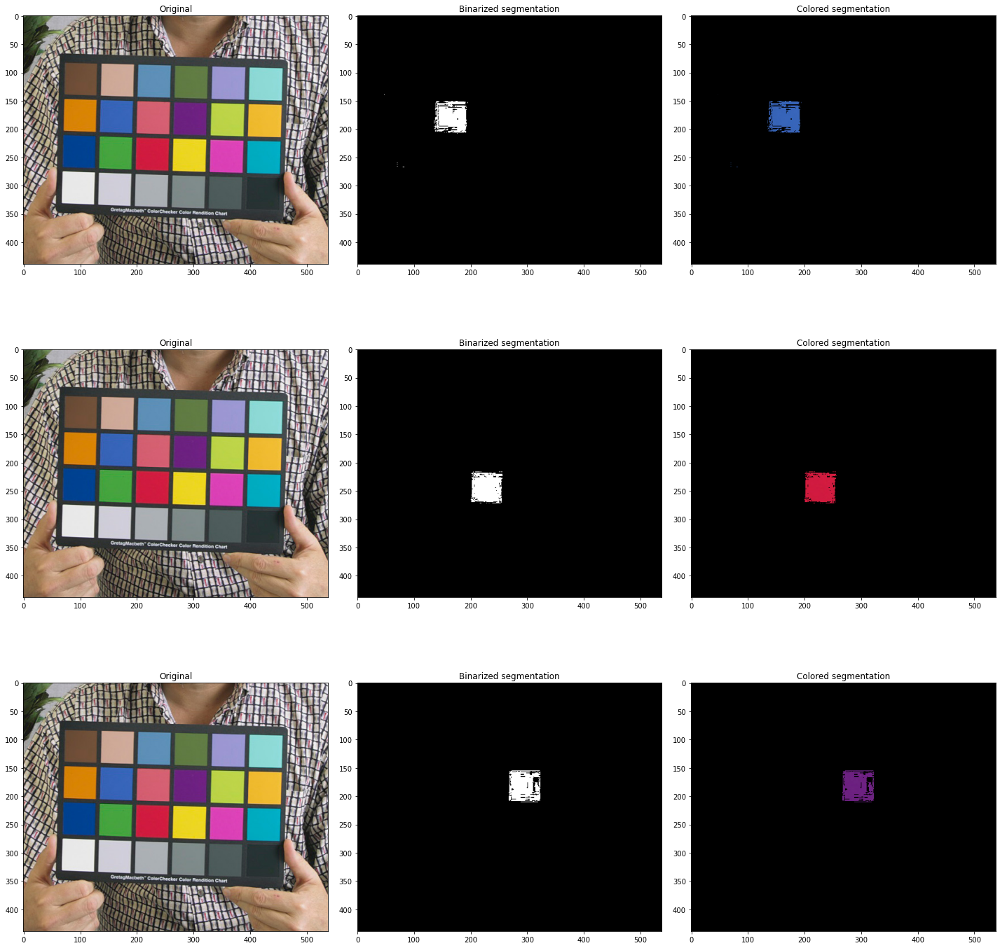

In [16]:
image = macbeth
runs = 3
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    P = nonparametric_segmenter(image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    ax[3*i].imshow(image)
    ax[3*i].set_title('Original')
    ax[3*i + 1].imshow(P,cmap='gray') 
    ax[3*i+1].set_title('Binarized segmentation')
    ax[3*i + 2].imshow(segmented_colored) 
    ax[3*i+2].set_title('Colored segmentation')

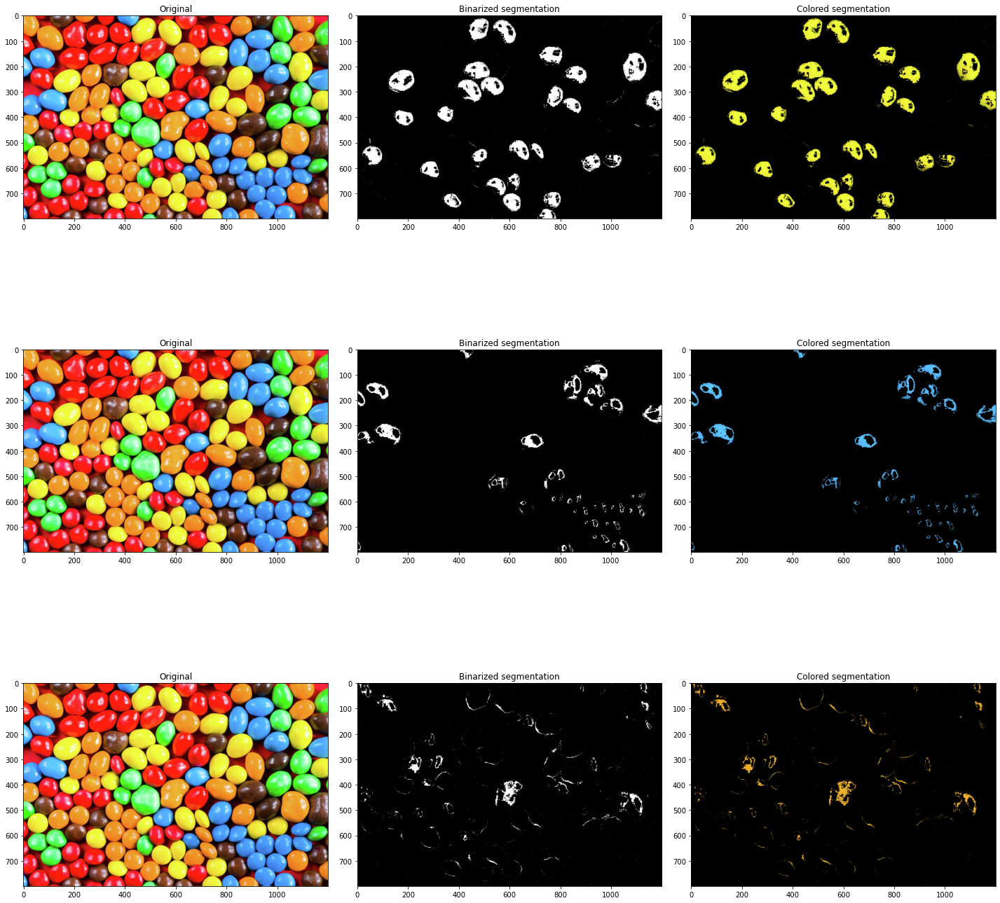

In [17]:
image = cv2.imread(path+'\m&ms.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
runs = 3
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    P = nonparametric_segmenter(image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    ax[3*i].imshow(image)
    ax[3*i].set_title('Original')
    ax[3*i + 1].imshow(P,cmap='gray') 
    ax[3*i+1].set_title('Binarized segmentation')
    ax[3*i + 2].imshow(segmented_colored) 
    ax[3*i+2].set_title('Colored segmentation')

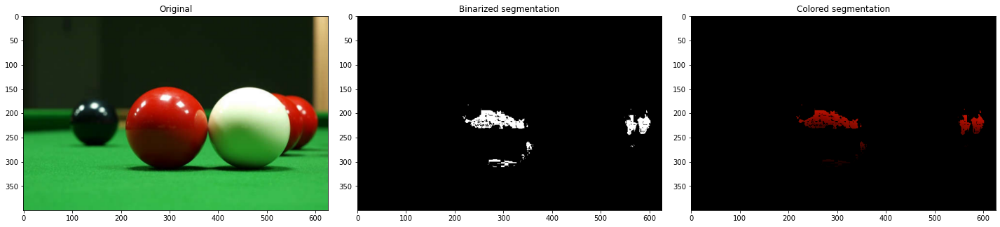

In [18]:
image = billiard
runs = 1
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    P = nonparametric_segmenter(image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')
    ax[4*i + 1].imshow(P,cmap='gray') 
    ax[4*i+1].set_title('Binarized segmentation')
    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Colored segmentation')

## Comparison

In [19]:
def gaussian_segmenter(image, ROI_image, binarized=True):
    image_ncc, ROI_ncc = ncc(image), ncc(ROI_image)
    r_mean, g_mean = np.mean(ROI_ncc[:,:,0]), np.mean(ROI_ncc[:,:,1])
    r_std, g_std = np.std(ROI_ncc[:,:,0]), np.std(ROI_ncc[:,:,1])
    P = gaussian(r_mean, r_std,image_ncc[:,:,0])*gaussian(g_mean, g_std, image_ncc[:,:,1])
    # print('red', gaussian(r_mean, r_std,image_ncc[:,:,0]))
    # print('green', gaussian(g_mean, g_std, image_ncc[:,:,1]))
    if binarized: 
        threshold_value = filters.threshold_otsu(P[np.isfinite(P)])   #handle only finite values, remove NaNs 
        P = P > threshold_value
    return P 

def nonparametric_segmenter(image, ROI_image, bins=32, binarized=True):
    image_ncc, ROI_ncc = ncc(image), ncc(ROI_image)

    #2D histogram of ROI
    x, y= ROI_ncc[:,:,0].flatten(), ROI_ncc[:,:,1].flatten()
    H = np.histogram2d(y,x, bins=bins, range=[[0,1],[0,1]])

    #Vectorized look-up algorithm based on 2D histogram
    x_indices = np.digitize(image_ncc[:,:,0], H[1]) - 1
    y_indices = np.digitize(image_ncc[:,:,1], H[2]) - 1

    # Prevent possible IndexErrors by clipping the values to the valid index ranges.
    x_indices = np.clip(x_indices, 0, bins-1)
    y_indices = np.clip(y_indices, 0, bins-1)
    
    P = H[0][y_indices, x_indices]
    if binarized: 
        threshold_value = filters.threshold_otsu(P[np.isfinite(P)])   #handle only finite values, remove NaNs 
        P = P > threshold_value
    return P

Vectorized vs Non-vectorized (brute force for loop)

In [20]:
import time 

image = cv2.imread(path+'\m&ms.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
image = billiard
ROI_image = image[1:51, 1:51]
binarized= True
image_ncc, ROI_ncc = ncc(image), ncc(ROI_image)

In [21]:
bins = 64
#2D histogram of ROI
x, y= ROI_ncc[:,:,0].flatten(), ROI_ncc[:,:,1].flatten()
H = np.histogram2d(y,x, bins=bins, range=[[0,1],[0,1]])

start = time.time()
M,N = np.shape(image_ncc[:,:,0])
P = np.zeros_like(image_ncc[:,:,0])

for i in range(M):
    for j in range(N):
        i_index = int(image_ncc[i,j,0]*(bins-1) + 1) 
        j_index = int(image_ncc[i,j,1]*(bins-1) + 1) 
        if i_index == bins:
            i_index = bins-1 
        if j_index == bins:
            j_index = bins-1
        P[i_index, j_index] = H[0][i_index, j_index]
if binarized: 
    threshold_value = filters.threshold_otsu(P[np.isfinite(P)])   #handle only finite values, remove NaNs 
    P = P > threshold_value

end = time.time()

#Vectorized look-up algorithm based on 2D histogram
x_indices = np.digitize(image_ncc[:,:,0], H[1]) - 1
y_indices = np.digitize(image_ncc[:,:,1], H[2]) - 1

# Prevent possible IndexErrors by clipping the values to the valid index ranges.
x_indices = np.clip(x_indices, 0, bins-1)
y_indices = np.clip(y_indices, 0, bins-1)

P = H[0][y_indices, x_indices]
if binarized: 
    threshold_value = filters.threshold_otsu(P[np.isfinite(P)])   #handle only finite values, remove NaNs 
    P = P > threshold_value

end2= time.time()

print('Runtime using nested for loops: {} s'.format(end-start))
print('Runtime using vectorized look-up: {} s'.format(end2-end))

Runtime using nested for loops: 2.214731454849243 s
Runtime using vectorized look-up: 0.02955031394958496 s


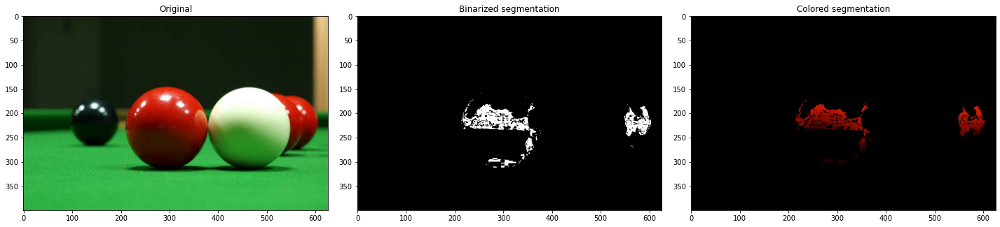

In [22]:
image = billiard
runs = 1
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
ROI_image = ROI(image)
for i in range(runs): 
    P = nonparametric_segmenter(image, ROI_image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')
    ax[4*i + 1].imshow(P,cmap='gray') 
    ax[4*i+1].set_title('Binarized segmentation')
    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Colored segmentation')

# Test 1: RGB Hues (constant ROI size)

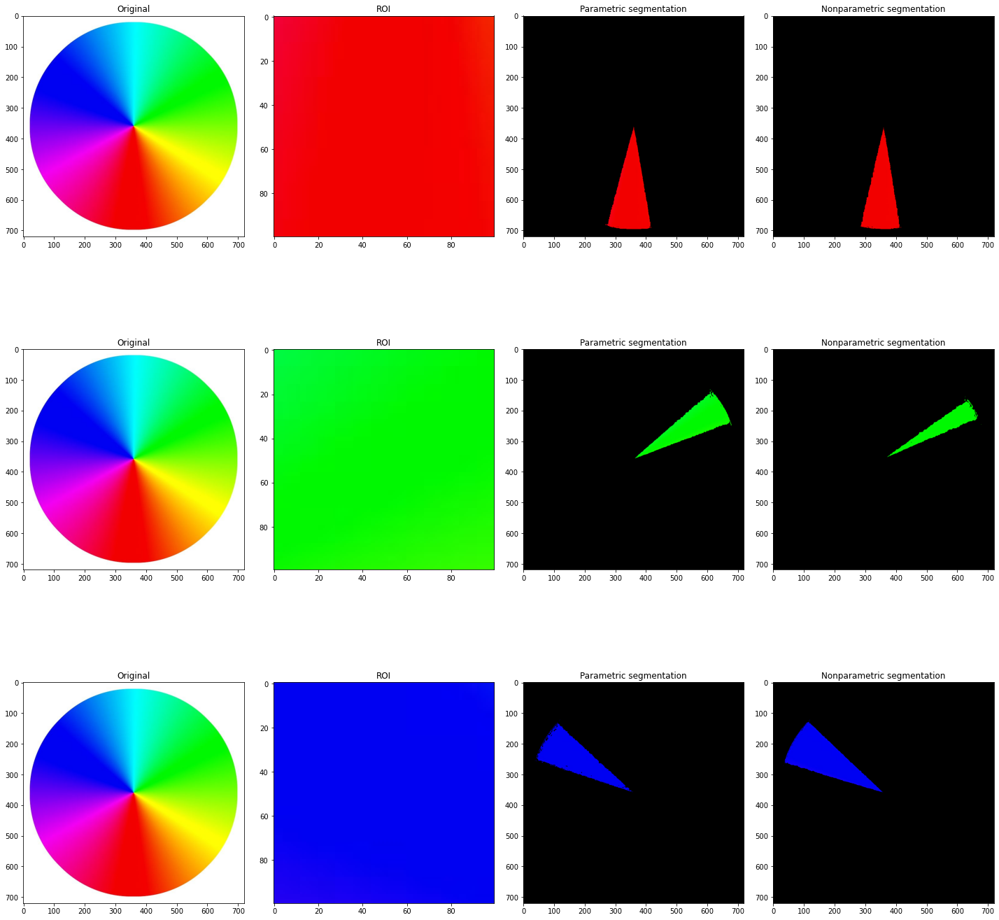

In [23]:
image = cv2.imread(path+'\color_wheel.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
runs = 3
fig, ax = plt.subplots(runs,4,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
ROI_images = [image[500:600, 300:400], image[200:300, 500:600], image[200:300, 100:200]]
for i in range(runs): 
    ROI_image = ROI_images[i]
    P_np = nonparametric_segmenter(image, ROI_image)
    P = gaussian_segmenter(image, ROI_image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)

    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')

    ax[4*i+1].imshow(ROI_image)
    ax[4*i+1].set_title('ROI')

    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Parametric segmentation')

    ax[4*i + 3].imshow(segmented_colored_np) 
    ax[4*i+3].set_title('Nonparametric segmentation')

# Test 2: Increasing ROI size

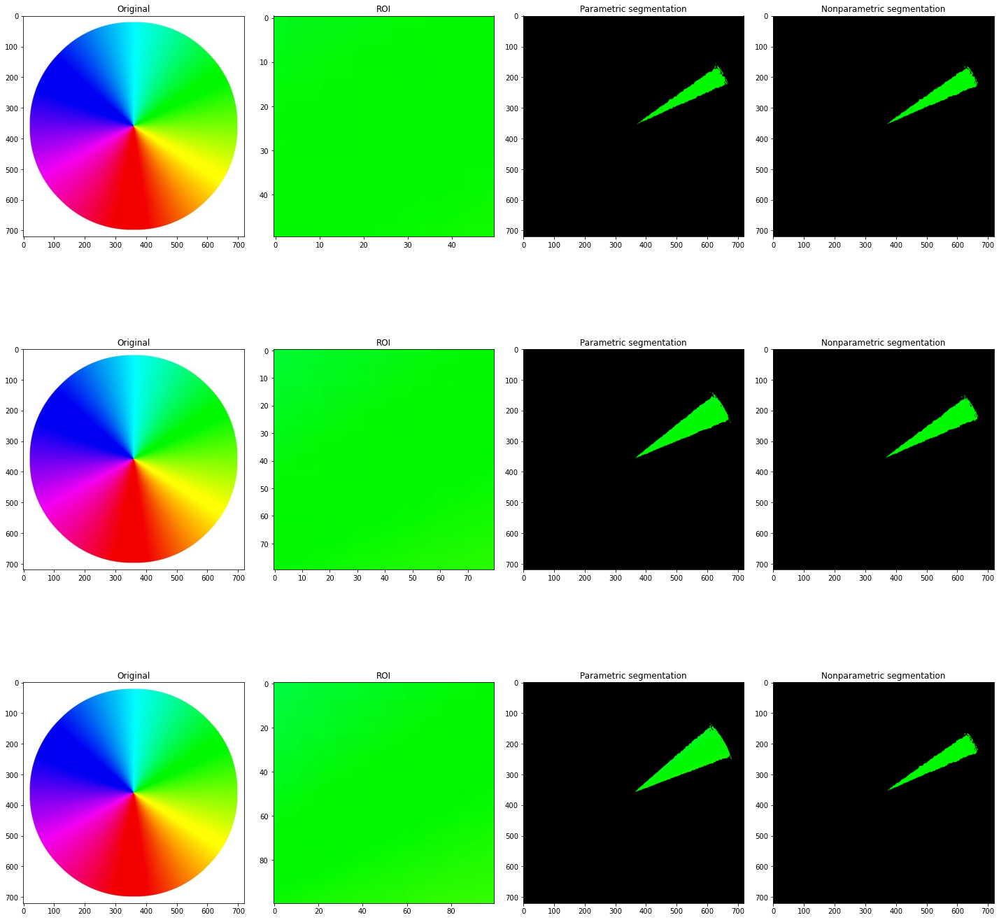

In [24]:
image = cv2.imread(path+'\color_wheel.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
runs = 3
fig, ax = plt.subplots(runs,4,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
ROI_images = [image[225:275, 525:575], image[210:290, 510:590], image[200:300, 500:600]]
for i in range(runs): 
    ROI_image = ROI_images[i]
    P_np = nonparametric_segmenter(image, ROI_image)
    P = gaussian_segmenter(image, ROI_image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)

    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')

    ax[4*i+1].imshow(ROI_image)
    ax[4*i+1].set_title('ROI')

    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Parametric segmentation')

    ax[4*i + 3].imshow(segmented_colored_np) 
    ax[4*i+3].set_title('Nonparametric segmentation')

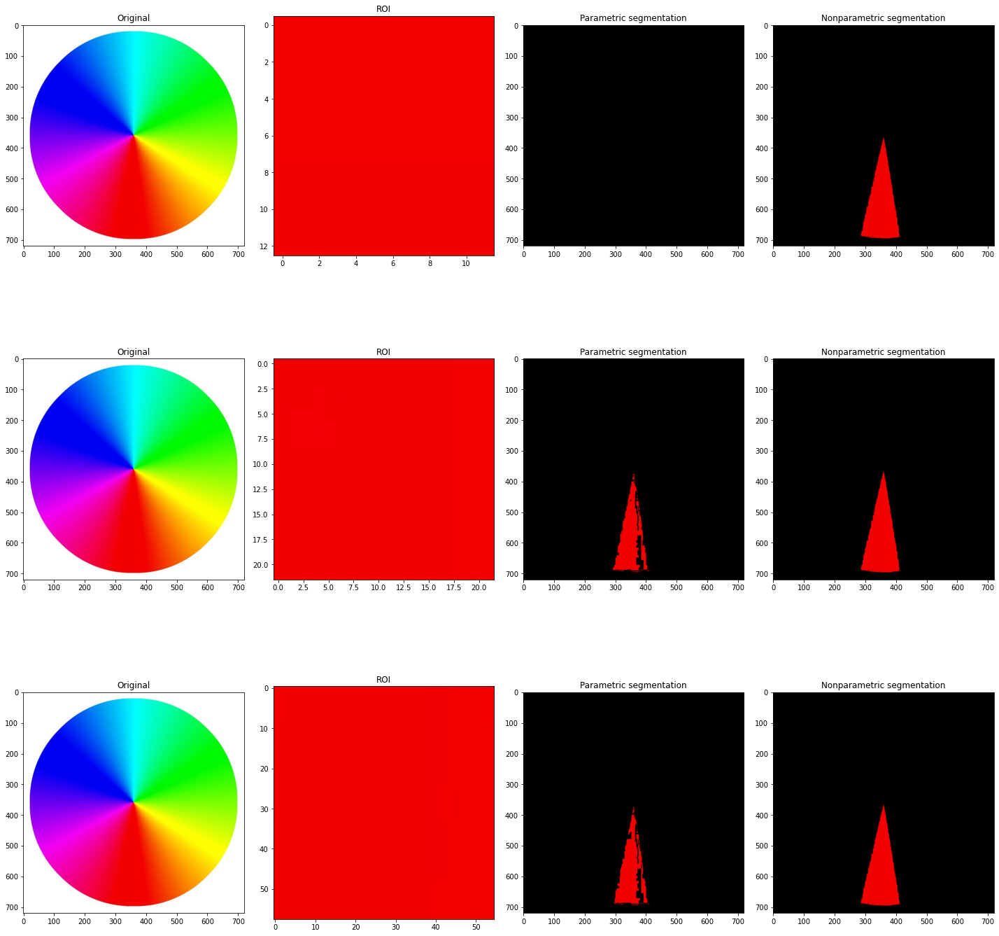

In [32]:
image = cv2.imread(path+'\color_wheel.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
runs = 3
fig, ax = plt.subplots(runs,4,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    ROI_image = ROI(image)
    P_np = nonparametric_segmenter(image, ROI_image)
    P = gaussian_segmenter(image, ROI_image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)
    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')

    ax[4*i+1].imshow(ROI_image)
    ax[4*i+1].set_title('ROI')

    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Parametric segmentation')

    ax[4*i + 3].imshow(segmented_colored_np) 
    ax[4*i+3].set_title('Nonparametric segmentation')

# Test 3: Increasing Bin Size (Non-parametric)

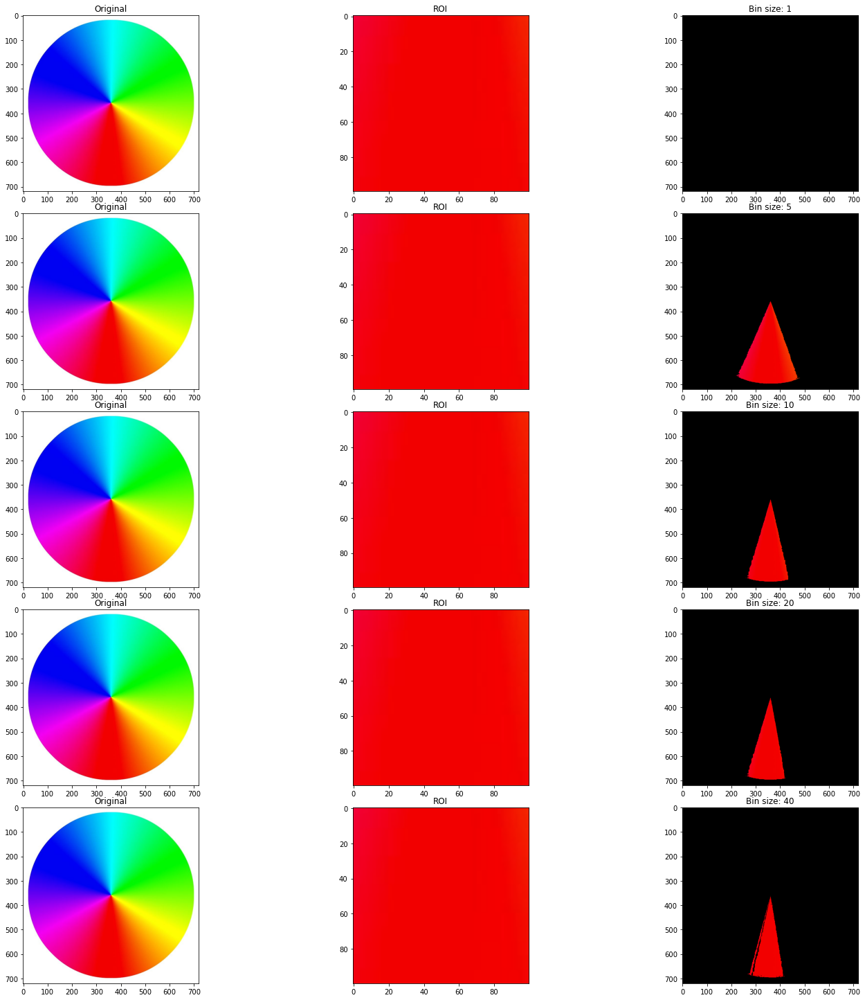

In [31]:
image = cv2.imread(path+'\color_wheel.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
runs = 5
fig, ax = plt.subplots(runs,3,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()

ROI_image = image[500:600, 300:400]
bins = [1, 5, 10, 20, 40]
for i in range(runs): 
    P_np = nonparametric_segmenter(image, ROI_image, bins=bins[i])
    segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)
    ax[3*i].imshow(image)
    ax[3*i].set_title('Original')

    ax[3*i+1].imshow(ROI_image)
    ax[3*i+1].set_title('ROI')

    ax[3*i + 2].imshow(segmented_colored_np) 
    ax[3*i + 2].set_title('Bin size: {}'.format(bins[i]))


# Test 4: Saturation Range

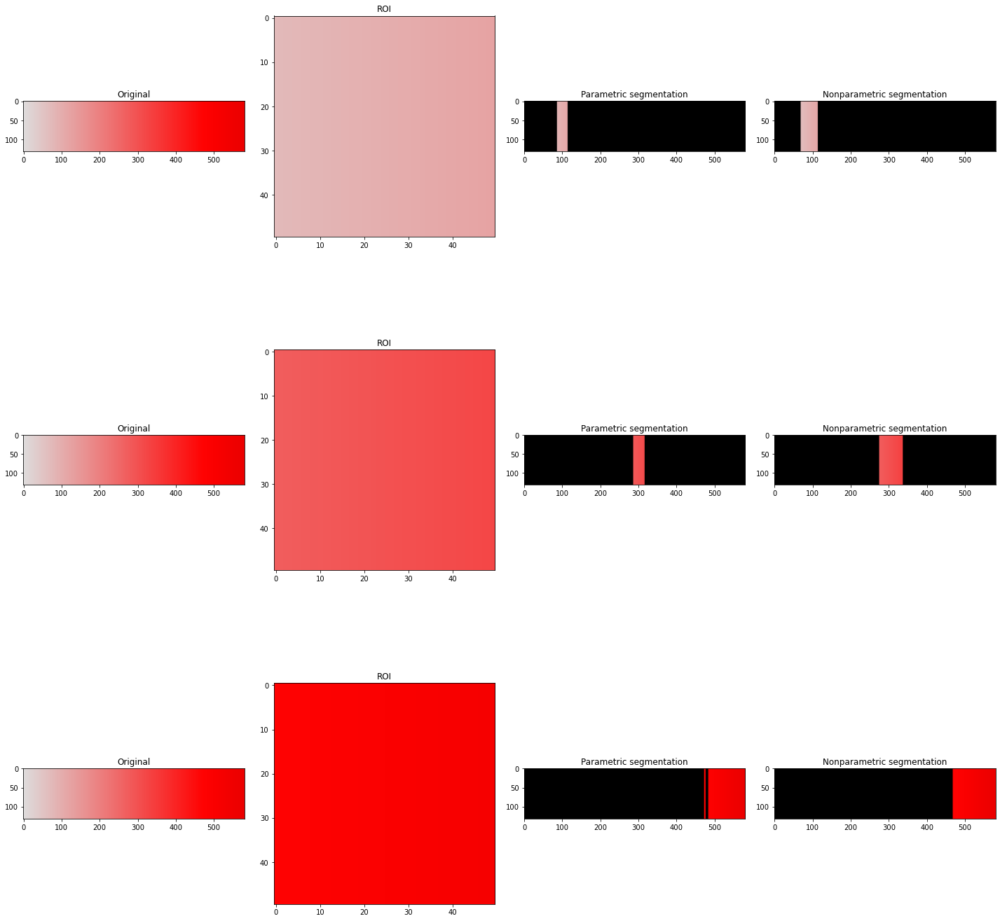

In [27]:
file2 = '\\saturation.png'
image=mpimg.imread(path+file2)[:,:,:3]
runs=3
fig, ax = plt.subplots(runs,4,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
ROI_images=[image[50:100, 75:125], image[50:100, 275:325], image[50:100, 475:525]]
for i in range(runs): 
    ROI_image=ROI_images[i]
    P_np = nonparametric_segmenter(image, ROI_image)
    P = gaussian_segmenter(image, ROI_image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)
    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')

    ax[4*i+1].imshow(ROI_image)
    ax[4*i+1].set_title('ROI')

    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Parametric segmentation')

    ax[4*i + 3].imshow(segmented_colored_np) 
    ax[4*i+3].set_title('Nonparametric segmentation')

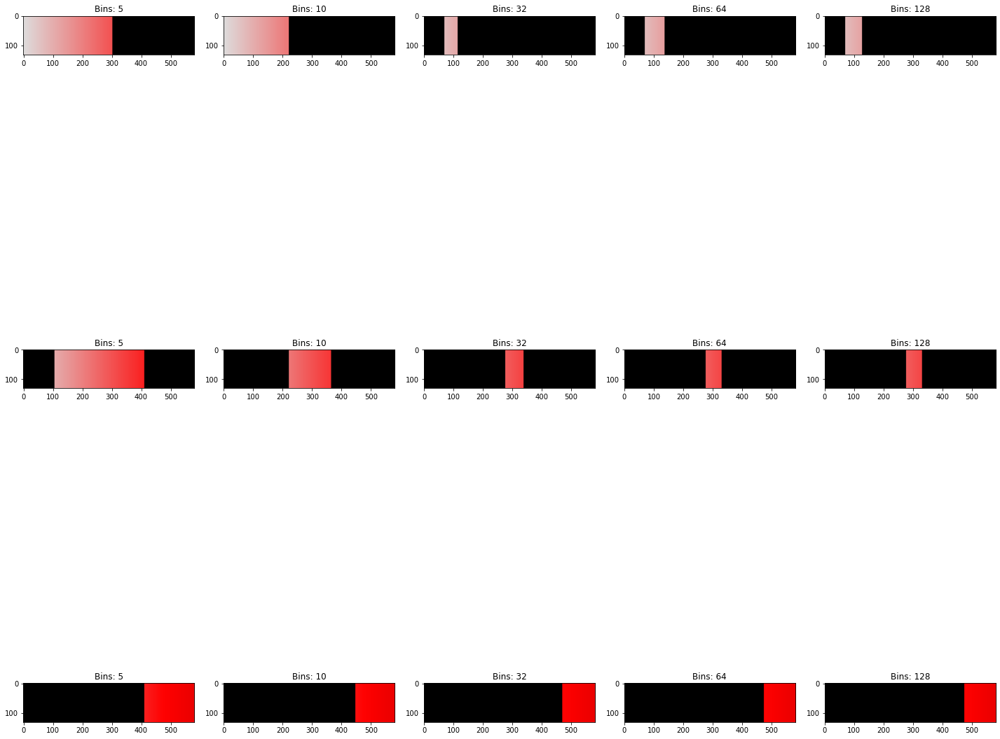

In [37]:
file2 = '\\saturation.png'
image=mpimg.imread(path+file2)[:,:,:3]
runs=3
fig, ax = plt.subplots(runs,5,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
ROI_images=[image[50:100, 75:125], image[50:100, 275:325], image[50:100, 475:525]]
bins = [5, 10, 32, 64, 128]
for i in range(runs): 
    for j in range(len(bins)):
        P_np = nonparametric_segmenter(image, ROI_images[i], bins=bins[j])
        segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)
        ax[5*i+j].imshow(segmented_colored_np)
        ax[5*i+j].set_title('Bins: {}'.format(bins[j]))

# Test 5: Analogous Colors

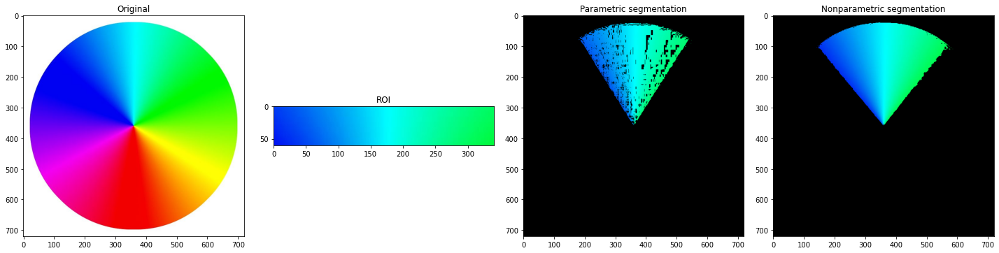

In [29]:
image = cv2.imread(path+'\color_wheel.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
runs = 1
fig, ax = plt.subplots(runs,4,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    ROI_image = ROI(image)
    P_np = nonparametric_segmenter(image, ROI_image)
    P = gaussian_segmenter(image, ROI_image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)
    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')

    ax[4*i+1].imshow(ROI_image)
    ax[4*i+1].set_title('ROI')

    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Parametric segmentation')

    ax[4*i + 3].imshow(segmented_colored_np) 
    ax[4*i+3].set_title('Nonparametric segmentation')

# Test 6

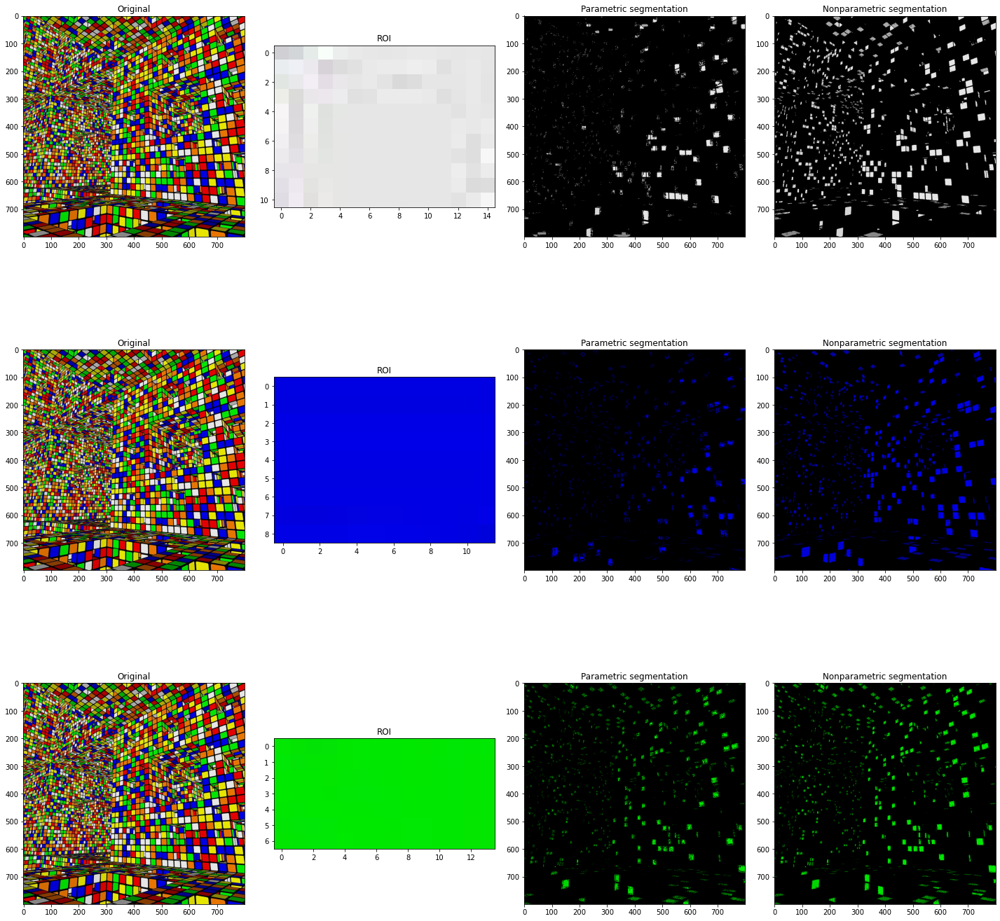

In [30]:
image = cv2.imread(path+'\\rubiks_room.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
runs = 3
fig, ax = plt.subplots(runs,4,figsize=(20,20))
fig.tight_layout()
ax=ax.flatten()
for i in range(runs): 
    ROI_image = ROI(image)
    P_np = nonparametric_segmenter(image, ROI_image)
    P = gaussian_segmenter(image, ROI_image)
    segmented_colored = np.stack([P*image[:,:,0], P*image[:,:,1], P*image[:,:,2]], axis=2)
    segmented_colored_np = np.stack([P_np*image[:,:,0], P_np*image[:,:,1], P_np*image[:,:,2]], axis=2)
    ax[4*i].imshow(image)
    ax[4*i].set_title('Original')

    ax[4*i+1].imshow(ROI_image)
    ax[4*i+1].set_title('ROI')

    ax[4*i + 2].imshow(segmented_colored) 
    ax[4*i+2].set_title('Parametric segmentation')

    ax[4*i + 3].imshow(segmented_colored_np) 
    ax[4*i+3].set_title('Nonparametric segmentation')

# Test 7

In [46]:
image = cv2.imread(path+'\m&ms.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

ROI_image = image[1:51, 1:51]
binarized= True
image_ncc, ROI_ncc = ncc(image), ncc(ROI_image)

start = time.time()
gaussian_segmenter(image, ROI_image)
end1 = time.time()
nonparametric_segmenter(image, ROI_image)
end2 = time.time()
M,N= np.shape(image_ncc[:,:,0])
print('Pixel count: {}'.format(M*N))
print('Runtime for parametric segmentation: {} s'.format(end1 - start))
print('Runtime for non-parametric segmentation: {} s'.format(end2 - end1))

Pixel count: 960000
Runtime for parametric segmentation: 0.17445158958435059 s
Runtime for non-parametric segmentation: 0.17134642601013184 s


In [47]:
image = billiard
ROI_image = image[1:51, 1:51]
binarized= True
image_ncc, ROI_ncc = ncc(image), ncc(ROI_image)

start = time.time()
gaussian_segmenter(image, ROI_image)
end1 = time.time()
nonparametric_segmenter(image, ROI_image)
end2 = time.time()
M,N= np.shape(image_ncc[:,:,0])
print('Pixel count: {}'.format(M*N))
print('Runtime for parametric segmentation: {} s'.format(end1 - start))
print('Runtime for non-parametric segmentation: {} s'.format(end2 - end1))

Pixel count: 250400
Runtime for parametric segmentation: 0.040663957595825195 s
Runtime for non-parametric segmentation: 0.04952502250671387 s


In [48]:
image = cv2.imread(path+'\high_res wallpaper.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

ROI_image = image[1:51, 1:51]
binarized= True
image_ncc, ROI_ncc = ncc(image), ncc(ROI_image)

start = time.time()
gaussian_segmenter(image, ROI_image)
end1 = time.time()
nonparametric_segmenter(image, ROI_image)
end2 = time.time()
M,N= np.shape(image_ncc[:,:,0])
print('Pixel count: {}'.format(M*N))
print('Runtime for parametric segmentation: {} s'.format(end1 - start))
print('Runtime for non-parametric segmentation: {} s'.format(end2 - end1))

Pixel count: 7506000
Runtime for parametric segmentation: 1.5571198463439941 s
Runtime for non-parametric segmentation: 1.3945341110229492 s


In [67]:
sizes = np.array([10*i+2 for i in range(250)])
times_parametric= []
times_nonparametric = []
for N in sizes: 
    # print(N)
    image = np.random.random_integers(0,255, size=(N,N,3))
    ROI_image = image[1:51, 1:51] 
    start = time.time()
    gaussian_segmenter(image, ROI_image)
    end1 = time.time()
    nonparametric_segmenter(image, ROI_image)
    end2 = time.time()
    times_parametric.append(end1-start)
    times_nonparametric.append(end2-end1)

C:\Users\Ron\AppData\Local\Temp/ipykernel_10404/3247465484.py:6: DeprecationWarning: This function is deprecated. Please call randint(0, 255 + 1) instead
  image = np.random.random_integers(0,255, size=(N,N,3))


Text(0, 0.5, 'Time (s)')

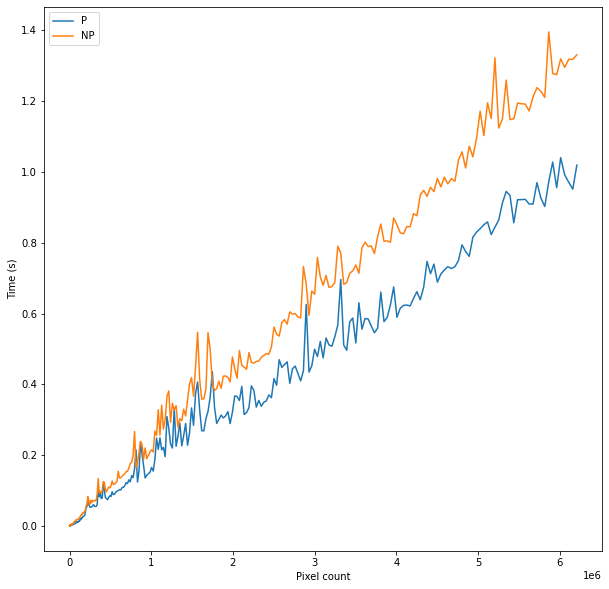

In [71]:
plt.figure(figsize=(10,10))
plt.plot(sizes**2, times_parametric, label='P')
plt.plot(sizes**2, times_nonparametric, label='NP')
plt.legend(loc='best')
plt.xlabel('Pixel count')
plt.ylabel('Time (s)')